<a href="https://colab.research.google.com/github/buihanhtrang/DIP_course/blob/main/dip_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Implement libraries

In [1]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image
import matplotlib.pyplot as plt

#Loading image

In [2]:
# # Create a list to store the urls of the images
# urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
#        "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
#       "https://placekitten.com/800/571"]
# # Read and display the image
# # loop over the image URLs, you could store several image urls in the list

# for url in urls:
#   image = io.imread(urls)
#   image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
#   final_frame = cv.hconcat((image, image_2))
#   cv2_imshow(final_frame)
#   print('\n')

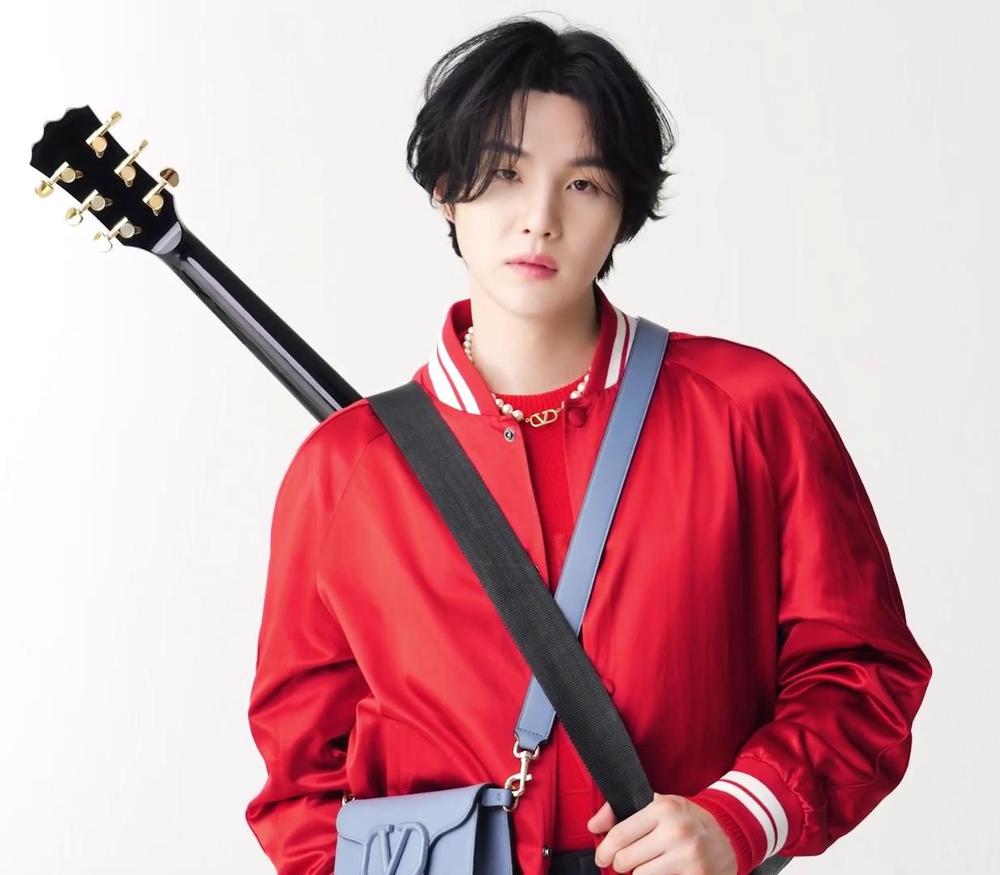

In [3]:
## TODO: LOAD IMAGE
url = "https://upload.wikimedia.org/wikipedia/commons/5/53/Suga_for_Marie_Claire_Korea%2C_May_2023_issue_05.png"
myImg = io.imread(url)
cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))

#1. Basic

##print the type and shape of images

In [4]:
# Check the image matrix data type (could know the bit depth of the image)
print(myImg.dtype)
# Check the height of image
print(myImg.shape[0])
# Check the width of image
print(myImg.shape[1])
# Check the number of channels of the image
print(myImg.shape[2])

uint8
1080
1234
3


##Gray scale of images

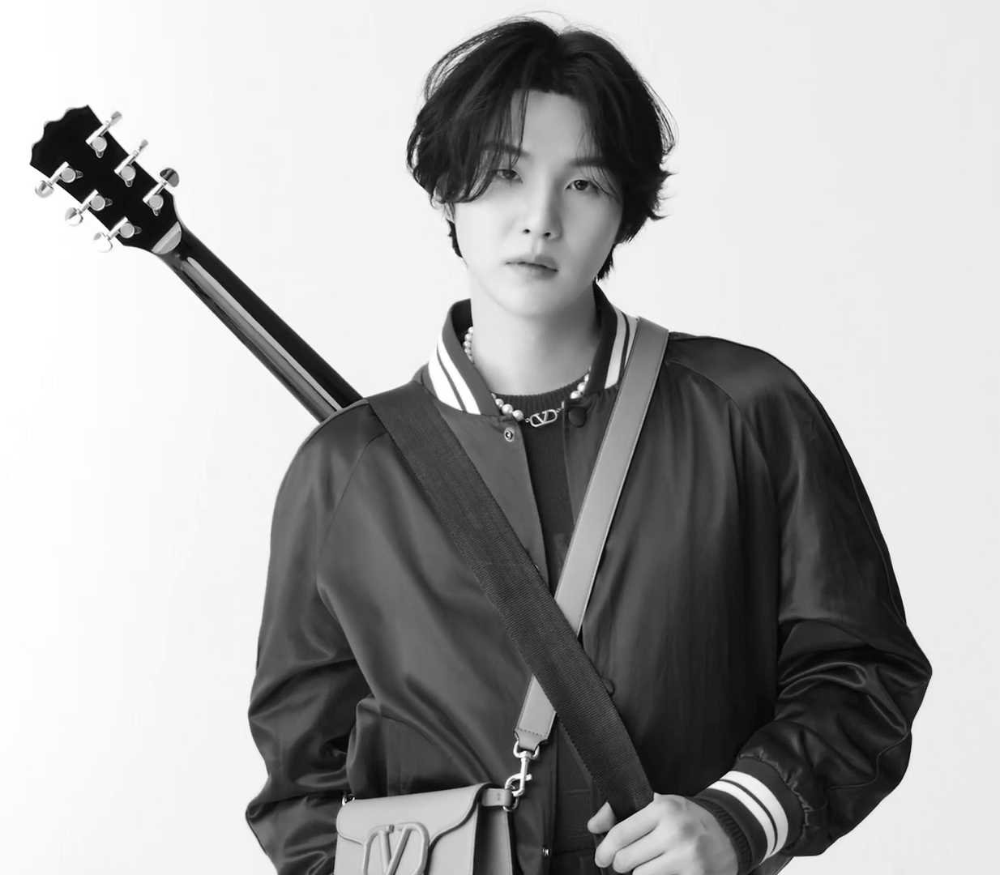

In [5]:
## CONVERT: RGB to grey scale
gray = cv.cvtColor(myImg, cv.COLOR_BGR2GRAY)
cv2_imshow(cv.cvtColor(gray, cv.COLOR_BGR2RGB))

In [6]:
# Check the image matrix data type (could know the bit depth of the image)
print(gray.dtype)
# Check the height of image
print(gray.shape[0])
# Check the width of image
print(gray.shape[1])
# Check the number of channels of the image
# print(gray.shape[2]): error because grey scale image doesnt have channel

uint8
1080
1234


# Histogram of an image

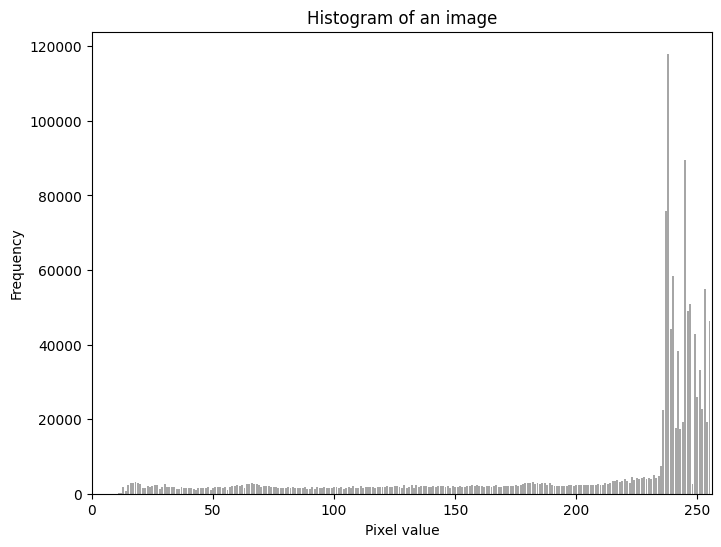

In [7]:
hist = cv.calcHist([myImg], [0], None, [256], [0,256])
#[0] here is the channel R, we can change the channel
x = np.arange(256)
#Convert the histogram values to a NumPy array for plotting
hist = np.squeeze(hist)
plt.figure(figsize=(8,6))
plt.bar(x, hist, color='gray', alpha = 0.7)
plt.title('Histogram of an image')
plt.xlabel('Pixel value')
plt.ylabel('Frequency')
plt.xlim([0,256])
plt.show()

In [8]:
#Calculate the max and min pixel values and their location
min_val, max_val, min_loc, max_loc = cv.minMaxLoc(gray)
print(min_val, max_val)
print('mean brightness',(max_val + min_val)/2)

0.0 255.0
mean brightness 127.5


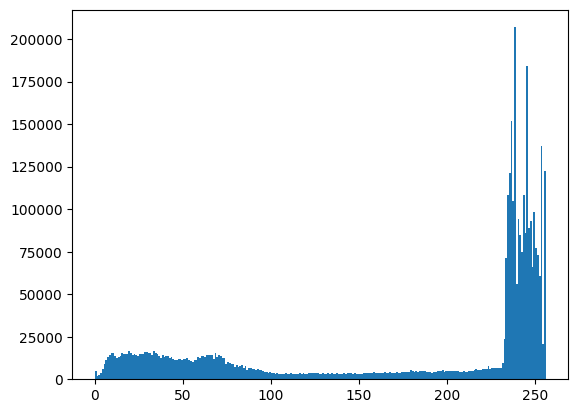

In [9]:
plt.hist(myImg.ravel(),bins = 256, range = [0,256])
plt.show()

# Image filtering

## Gamma correction

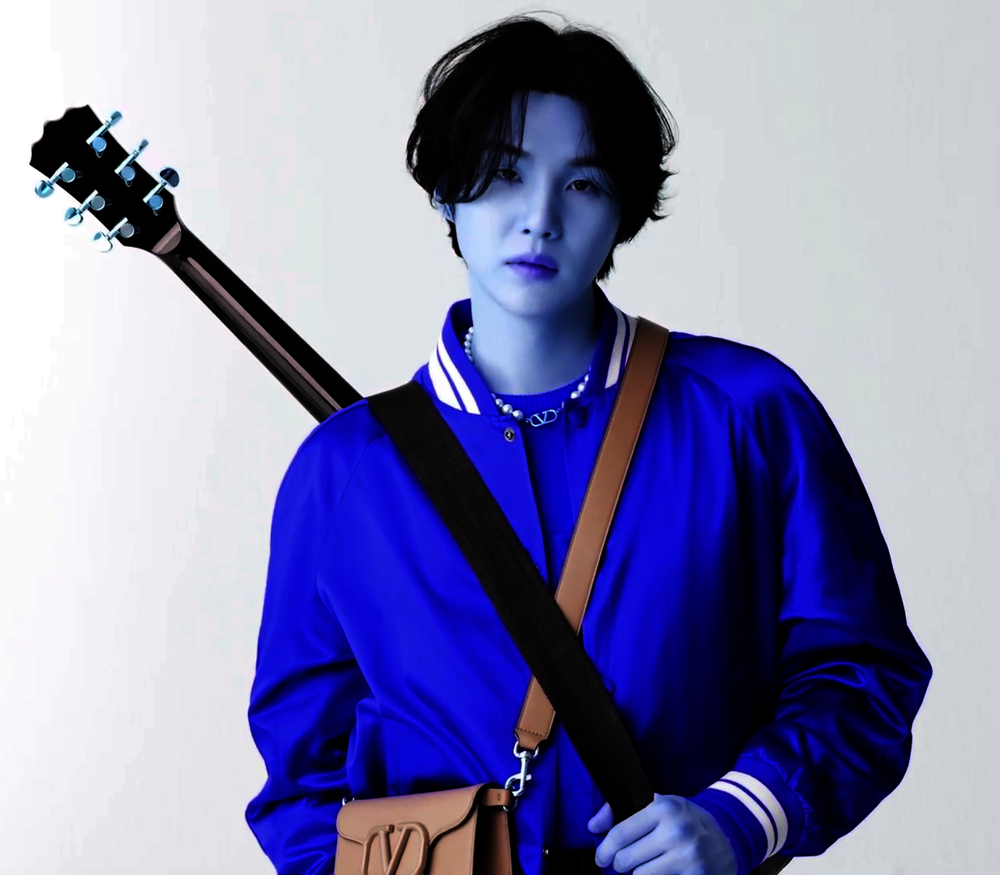

In [10]:
#Gamma correction
#Define the gammma value (adjust as needed)
gamma = 2.5 #darker
#gamma = 0.2 #brighter
#Apply gamma correction
corrected_img = np.power(myImg/255.0, gamma)*255.0
corrected_img = corrected_img.astype(np.uint8)
cv2_imshow(corrected_img)

##Histogram of gramma correlation image

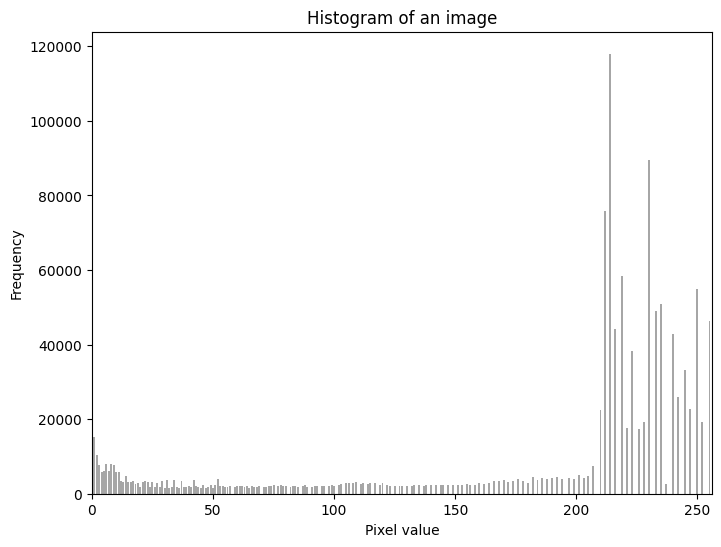

In [11]:
hist = cv.calcHist([corrected_img],[0], None, [256], [0,256])
#[0] here is the channel R, we can change the channel
x = np.arange(256)
#Convert the histogram values to a NumPy array for plotting
hist = np.squeeze(hist)
plt.figure(figsize=(8,6))
plt.bar(x, hist, color='gray', alpha = 0.7)
plt.title('Histogram of an image')
plt.xlabel('Pixel value')
plt.ylabel('Frequency')
plt.xlim([0,256])
plt.show()

## Gaussian Blur image

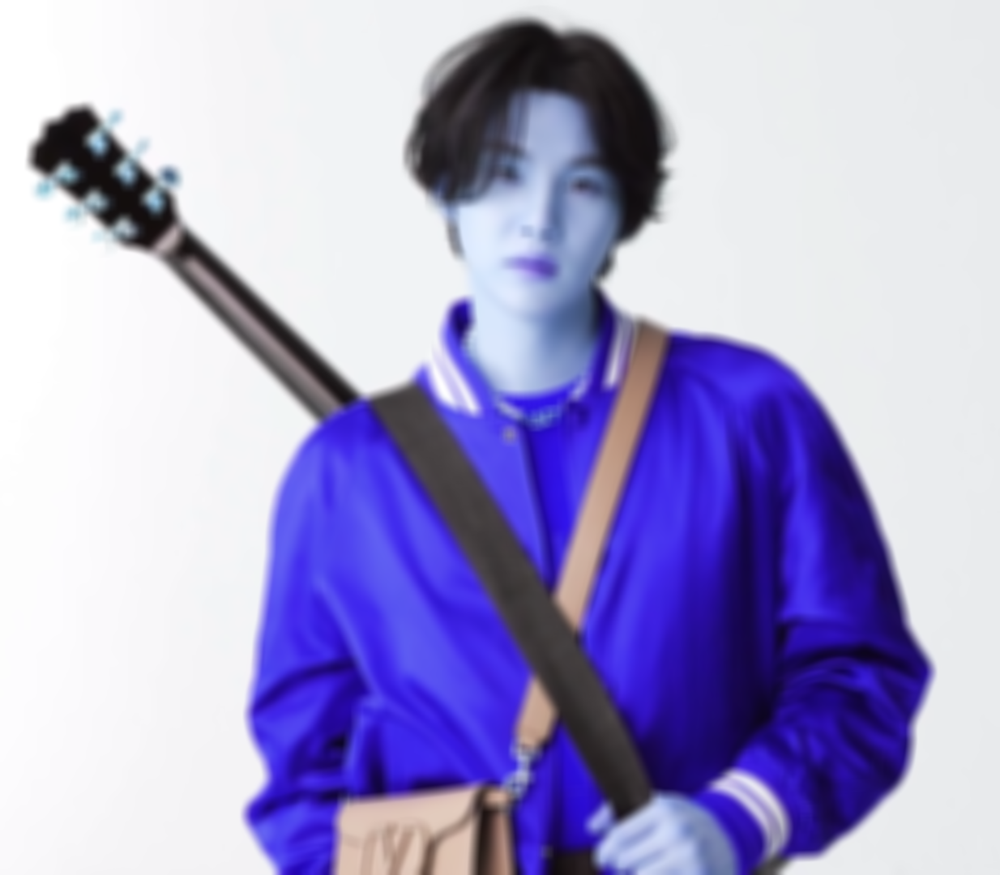

In [12]:
ksize = (15,15)
#Apply Gaussian blur the image
#blurred_image = cv.GaussianBlur(myImg, ksize, 0)
blurred_image = cv.GaussianBlur(myImg, ksize, 2000)
cv2_imshow(blurred_image)

## Median Blur filter

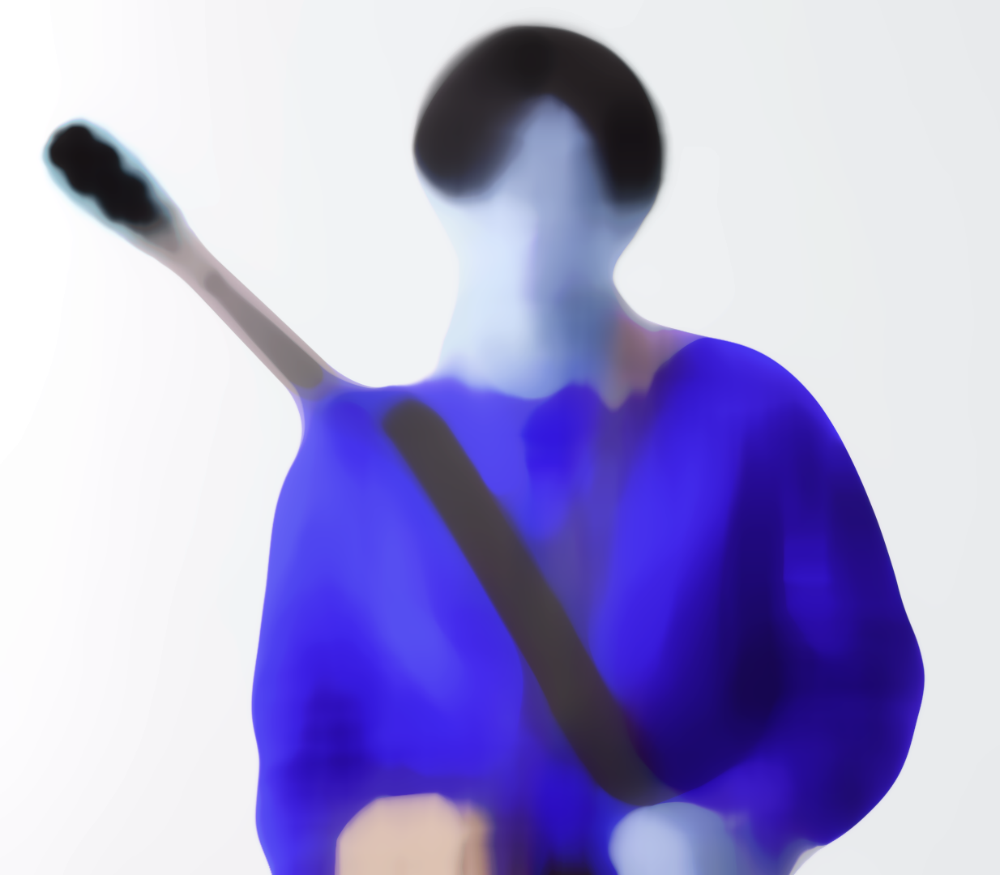

In [13]:
median_img = cv.medianBlur(myImg,99)
cv2_imshow(median_img)

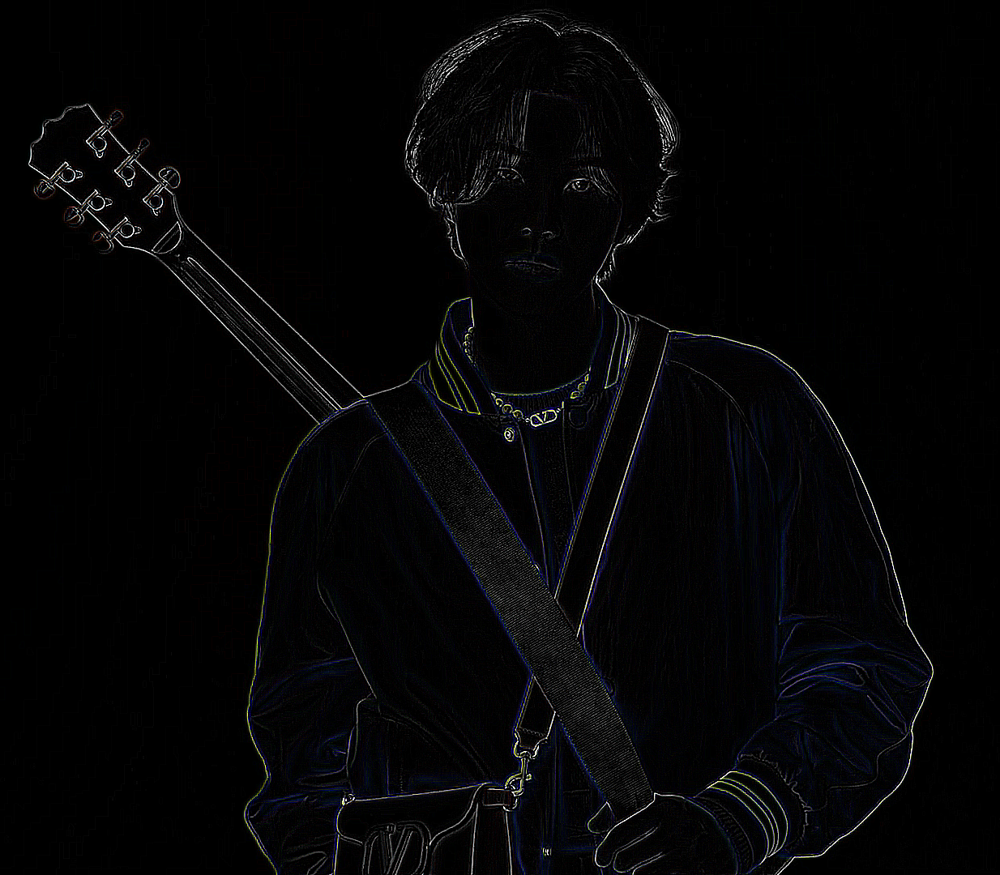

In [14]:
#sharpening
#circle_path =
#image =
kernel9 = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
gradient10 = cv.filter2D(src=myImg,ddepth=-1,kernel=kernel9)
#Kiểm tra giá trị tối đa và tối thiêiru của ảnh
min_value1=gradient10.min()
max_value1=gradient10.max()
#Chuyển đổi giá trị màu từ 0-1 sang 0-255
img0to255 = ((gradient10 - min_value1) / (max_value1 - min_value1)*255).astype('uint8')
cv2_imshow(img0to255)

# Frequency Filter

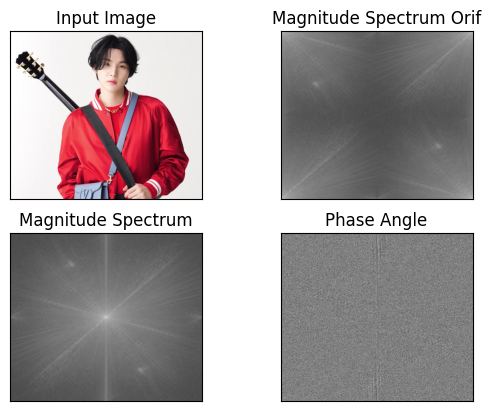

In [15]:
f = np.fft.fft2(gray)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))
magnitude_spectrum_ori = 20*np.log(np.abs(f)) #if not shift what happens?
imagery = np.angle(fshift)
plt.subplot(221), plt.imshow(myImg)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(magnitude_spectrum_ori, cmap = 'gray')
plt.title("Magnitude Spectrum Orif"), plt.xticks([]), plt.yticks([])
plt.subplot(223), plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title("Magnitude Spectrum"), plt.xticks([]), plt.yticks([])
plt.subplot(224), plt.imshow(imagery, cmap = 'gray')
plt.title("Phase Angle"), plt.xticks([]), plt.yticks([])
plt.show()

Fourier transform By openCV

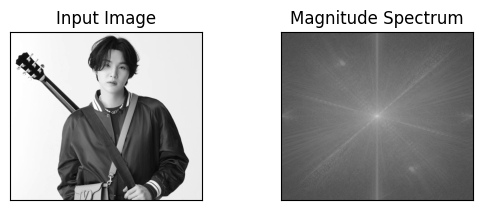

In [16]:
dft = cv.dft(np.float32(gray),flags = cv.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)
magnitude_spectrum2 = 20*np.log(cv.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))
plt.subplot(221), plt.imshow(gray, cmap = 'gray')
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(magnitude_spectrum2, cmap = 'gray')
plt.title("Magnitude Spectrum"), plt.xticks([]), plt.yticks([])
plt.show()

đưa về ảnh gốc

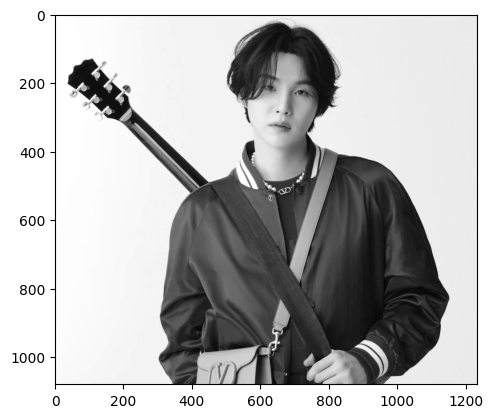

In [17]:
combined = np.multiply(np.abs(f), np.exp(1j*np.angle(f)))
imgCombined = np.real(np.fft.ifft2(combined))
plt.imshow(imgCombined, cmap = 'gray')

lowpass filter

In [18]:
w, h = gray.shape[:2]
cx, cy = w //2, h //2

fshift[cx-30:cx+31, cy-30:cy+31] =0
# """fshift[cx-30:cx+31, cy-30:cy+31] =0
# fshift[cx-30:cx+31, cy-30:cy+31] =0
# fshift[cx-30:cx+31, cy-30:cy+31] =0"""

f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.real(img_back)

/usr/local/lib/python3.10/dist-packages/google/colab/patches/__init__.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
  a = a.clip(0, 255).astype('uint8')


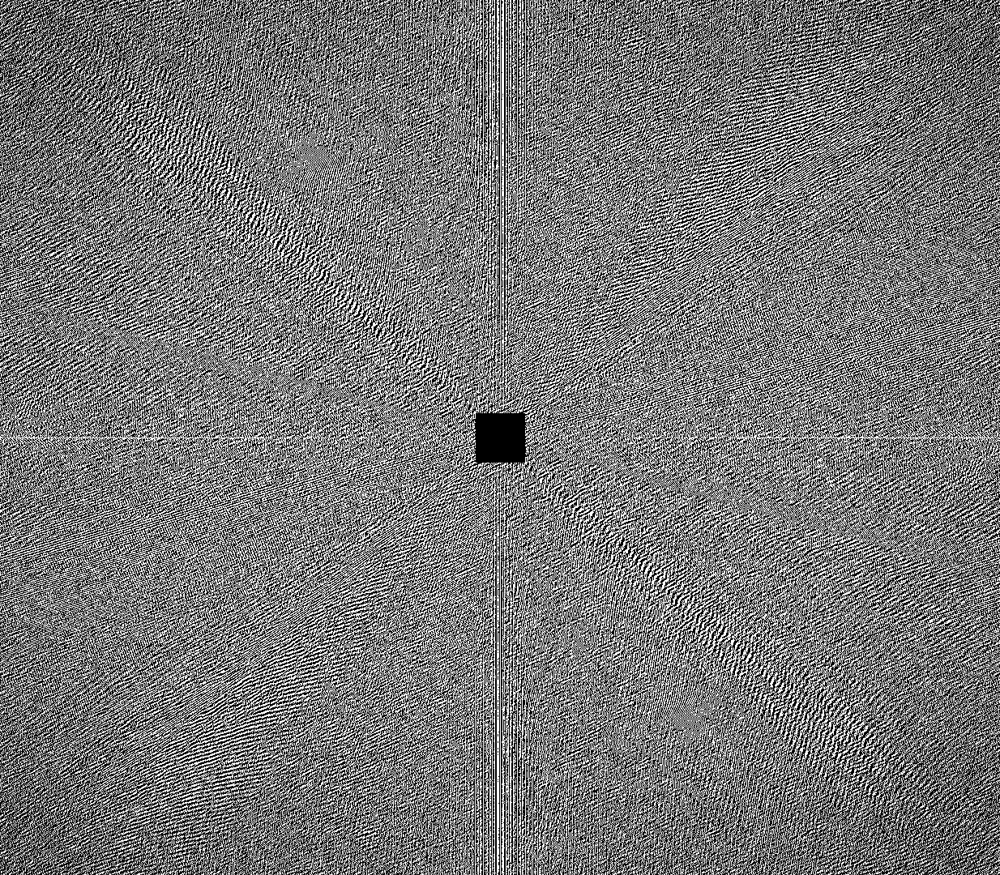

In [19]:
cv2_imshow(fshift)

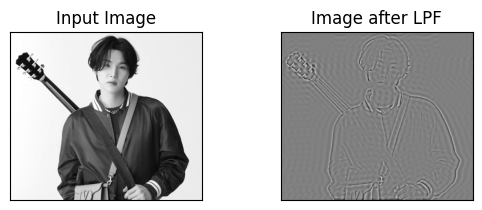

In [20]:
plt.subplot(221), plt.imshow(gray, cmap = 'gray')
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(img_back, cmap = 'gray')
plt.title("Image after LPF"), plt.xticks([]), plt.yticks([])
plt.show()

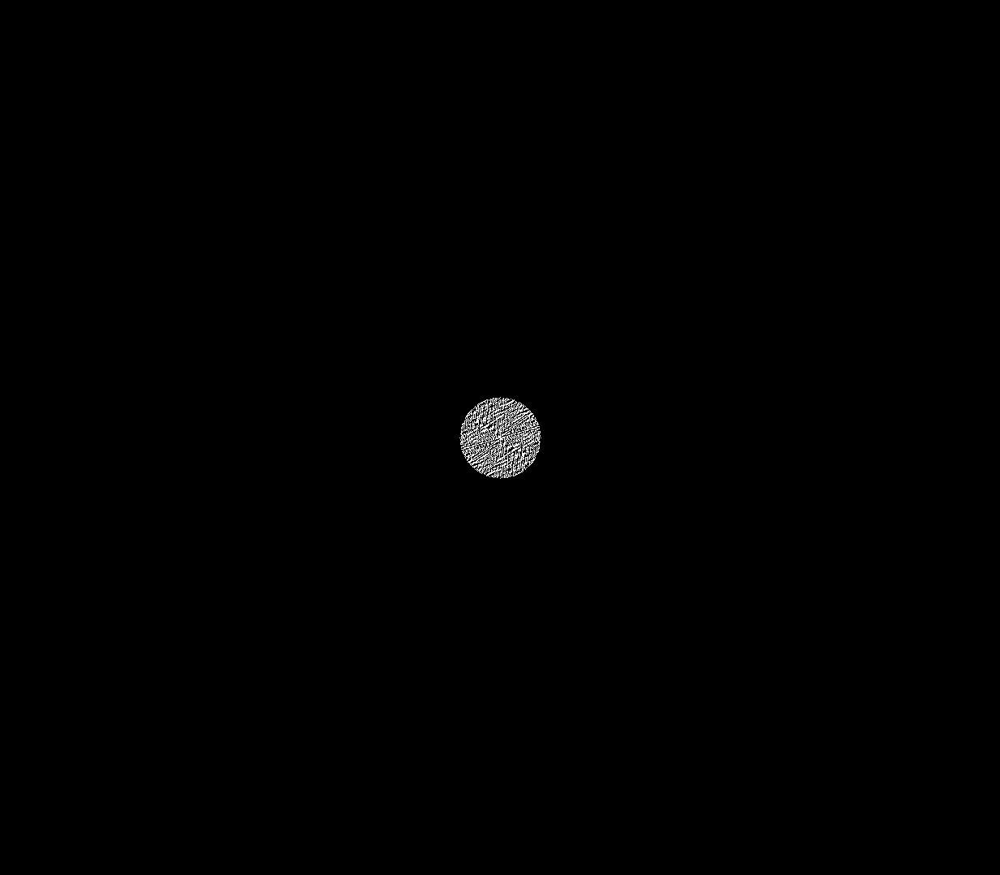

In [21]:
def circle_mask(image, radius, high_or_low):
  f = np.fft.fft2(image)
  fshift =  np.fft.fftshift(f)
  height, width = image.shape[:2]
  center = (width // 2, height // 2)

  Y, X = np.ogrid[:height, :width]
  dist_from_center = np.sqrt((X - center[0])**2 + (Y - center[1])**2)
  if high_or_low == 0:
    mask = dist_from_center <= radius
  if high_or_low == 1:
    mask = dist_from_center >= radius
  result = np.where(mask, fshift, 0)
  return result

#0 is low pass and 1 is high pass
fshift = circle_mask(gray, 50, 0)
cv2_imshow(fshift)

Another circle mask



[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


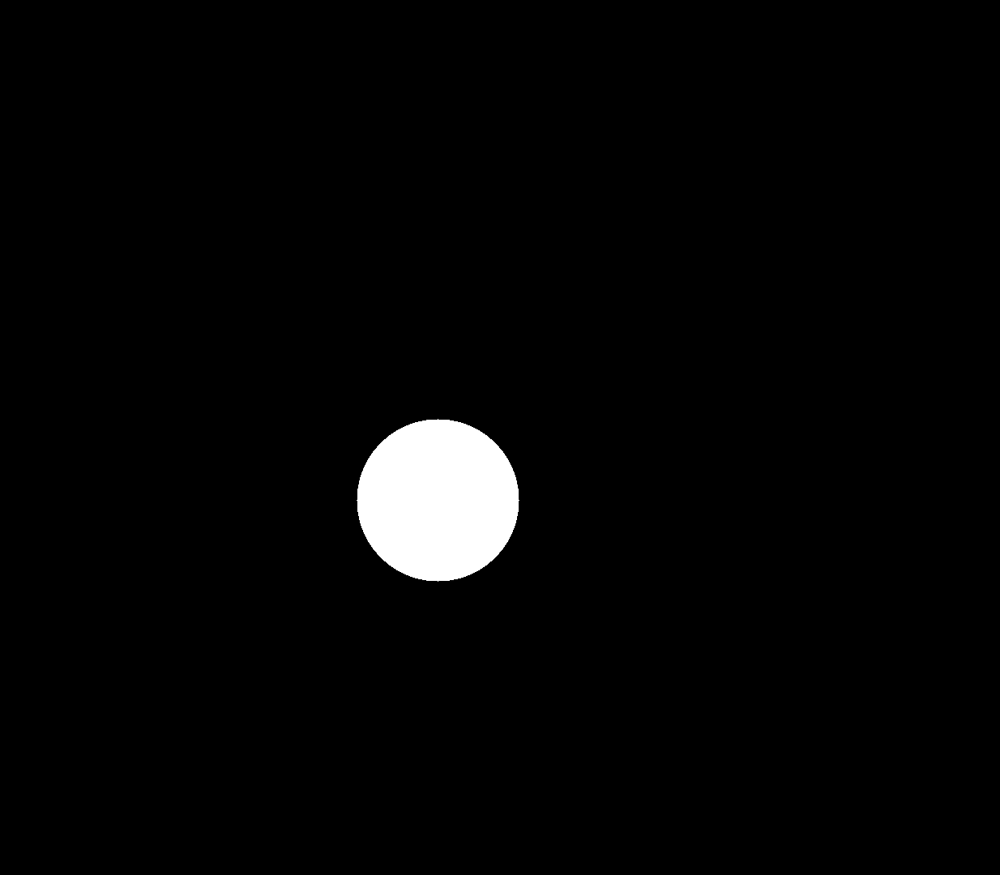

In [22]:
row, col = gray.shape
circleImg = np.zeros((row, col, 3), dtype = np.uint8)
print(circleImg)
cen = (row//2, col//2)
radius = 100
color = (255, 255, 255)
thickness = -1
cv.circle(circleImg, cen, radius, color, thickness)
cv2_imshow(circleImg)

#circleImg_gray = cv.cvtColor(circleImg, cv.COLOR_BGR2GRAY)

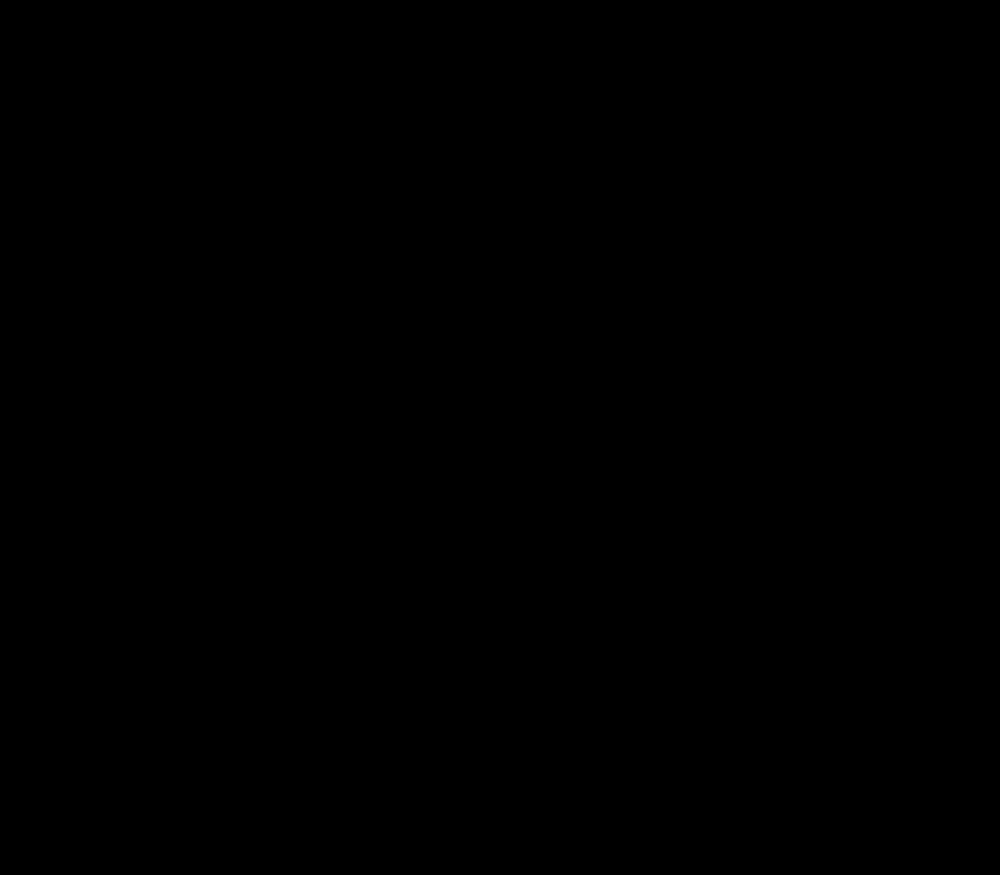

In [23]:
row, col = gray.shape
circleImg = np.zeros((row, col, 3), dtype = np.uint8)

cen = (row//2, col//2)
radius = 100
color = (0,0,0)
thickness = -1
cv.circle(circleImg, cen, radius, color, thickness)
cv2_imshow(circleImg)

#circleImg_gray = cv.cvtColor(circleImg, cv.COLOR_BGR2GRAY)

##High pass filter

(Text(0.5, 1.0, 'Image after HPF'), ([], []), ([], []))

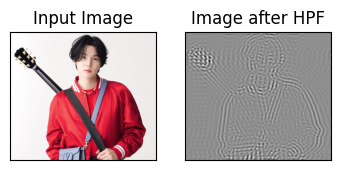

In [24]:
rows, cols = gray.shape
crow,ccol = rows//2 , cols//2
fshift[crow-30:crow+31, ccol-30:ccol+31] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.real(img_back)

plt.subplot(131),plt.imshow(myImg, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
# plt.subplot(133),plt.imshow(imagery, cmap = 'gray')
# plt.show()

In [28]:
# f = np.fft.fft2(gray)
# fshift =  np.fft.fftshift(f)

# circleImg_gray = cv.cvtColor(circleImg, cv.COLOR_BGR2GRAY)
# for i in range(row):
#   for j in range(col):
#     circleImg_gray[circleImg_gray == 0] = 255

# fshift = fshift * circleImg_gray
# cv2_imshow(fshift)

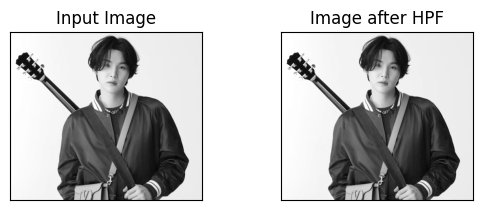

In [29]:
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.real(img_back)

plt.subplot(221), plt.imshow(gray, cmap = 'gray')
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222), plt.imshow(img_back, cmap = 'gray')
plt.title("Image after HPF"), plt.xticks([]), plt.yticks([])
plt.show()

Demonstrate that Gaussian, Median filters are low-pass filters, and Laplacian is high-pass filter.

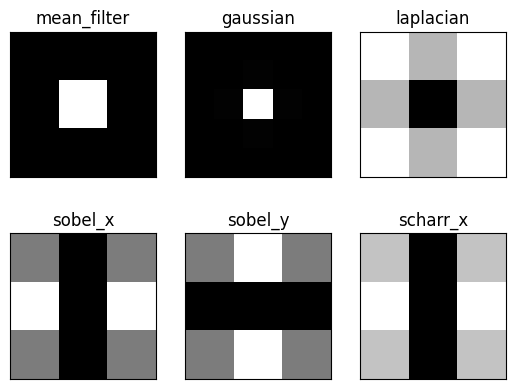

In [30]:
# simple averaging filter without scaling parameter
mean_filter = np.ones((3,3))
# creating a gaussian filter
x = cv.getGaussianKernel(5,10)
gaussian = x*x.T
# different edge detecting filters
# scharr in x-direction
scharr = np.array([[-3, 0, 3],
                   [-10,0,10],
                   [-3, 0, 3]])
# sobel in x direction
sobel_x= np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])
# sobel in y direction
sobel_y= np.array([[-1,-2,-1],
                   [0, 0, 0],
                   [1, 2, 1]])
# laplacian
laplacian=np.array([[0, 1, 0],
                    [1,-4, 1],
                    [0, 1, 0]])
filters = [mean_filter, gaussian, laplacian, sobel_x, sobel_y, scharr]
filter_name = ['mean_filter', 'gaussian','laplacian', 'sobel_x', \
                'sobel_y', 'scharr_x']
fft_filters = [np.fft.fft2(x) for x in filters]
fft_shift = [np.fft.fftshift(y) for y in fft_filters]
mag_spectrum = [np.log(np.abs(z)+1) for z in fft_shift]
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(mag_spectrum[i],cmap = 'gray')
    plt.title(filter_name[i]), plt.xticks([]), plt.yticks([])
plt.show()

# Color model

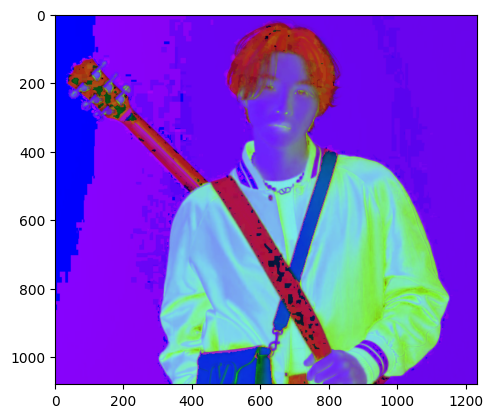

In [31]:
hsv = cv.cvtColor(myImg, cv.COLOR_BGR2HSV)
lab = cv.cvtColor(myImg, cv.COLOR_BGR2Lab)

plt.imshow(hsv, cmap = 'gray')
#plt.imshow(lab, cmap = 'gray')

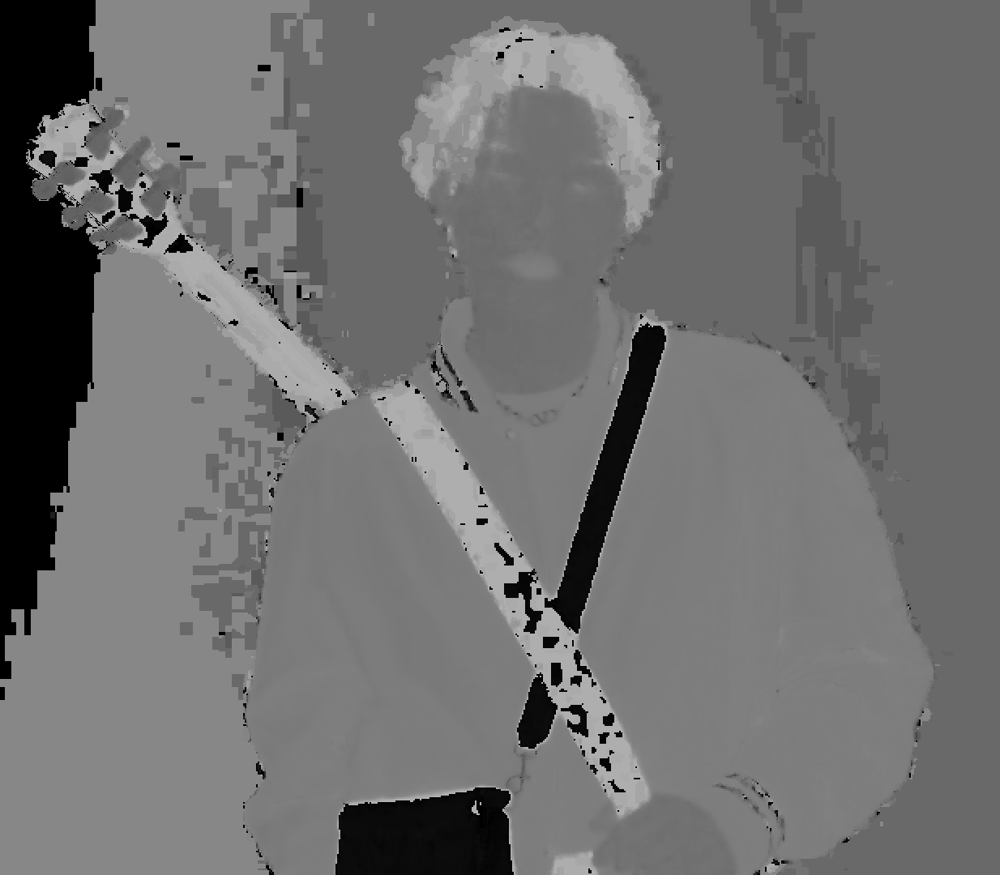

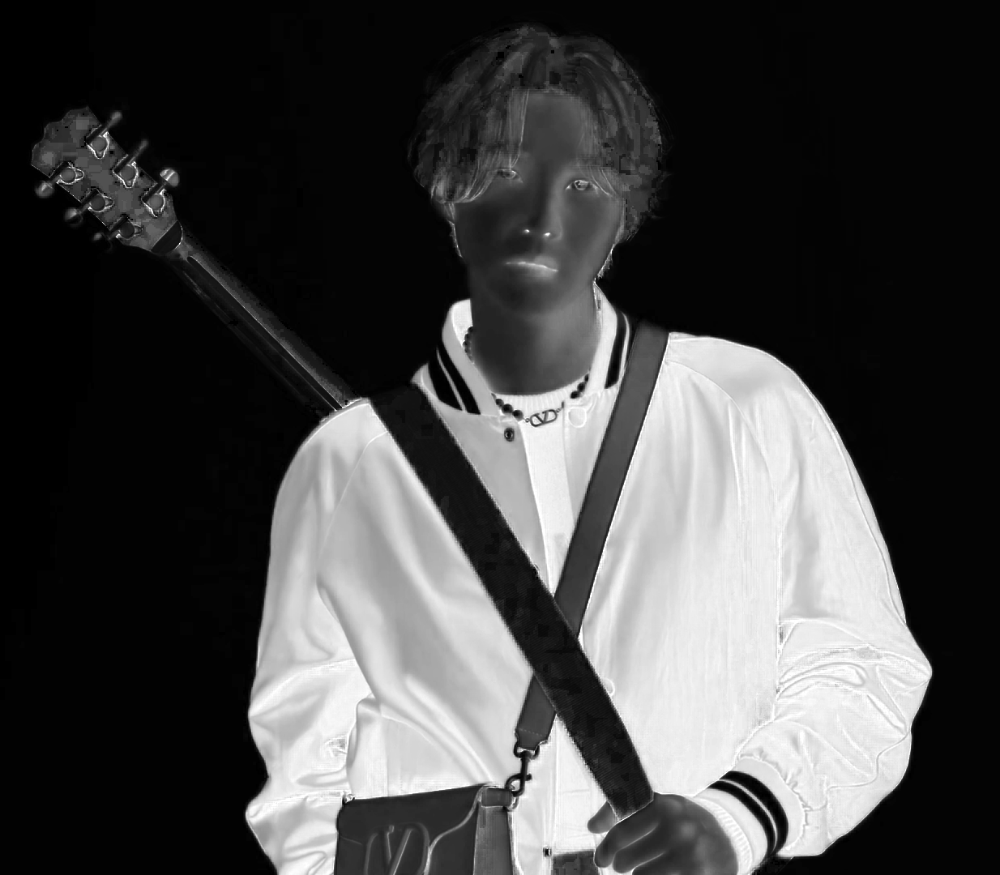

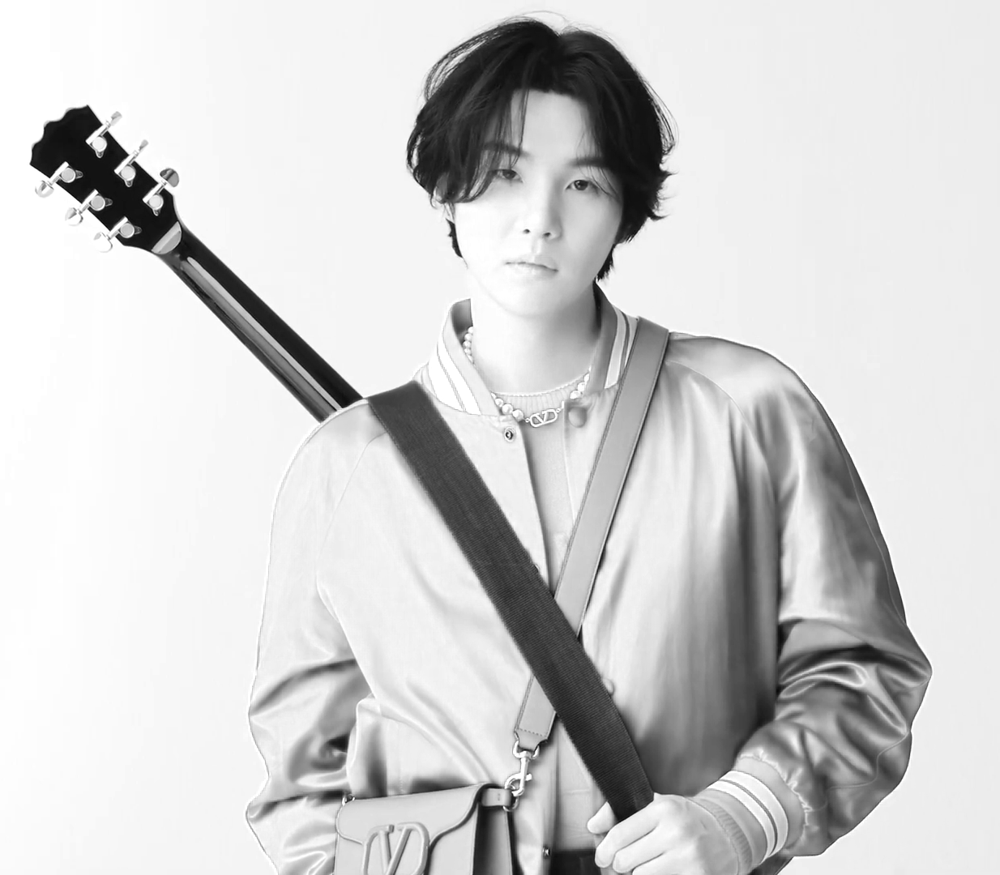

In [32]:
#split the image into its color channels
hChannel , sChannel, vChannel = cv.split(hsv)

#Display or save the individual channels
cv2_imshow(hChannel)
cv2_imshow(sChannel)
cv2_imshow(vChannel)

Color mapping apllied



In [33]:
import matplotlib as mpl
import matplotlib.cm as cm

norm = mpl.colors.Normalize(vmin=-20, vmax=10)
cmap = cm.hot
x = 0.3

m = cm.ScalarMappable(norm=norm, cmap=cmap)
print(m.to_rgba(x))

(1.0, 0.8225486412996345, 0.0, 1.0)


https://docs.opencv.org/4.x/d3/d50/group__imgproc__colormap.html

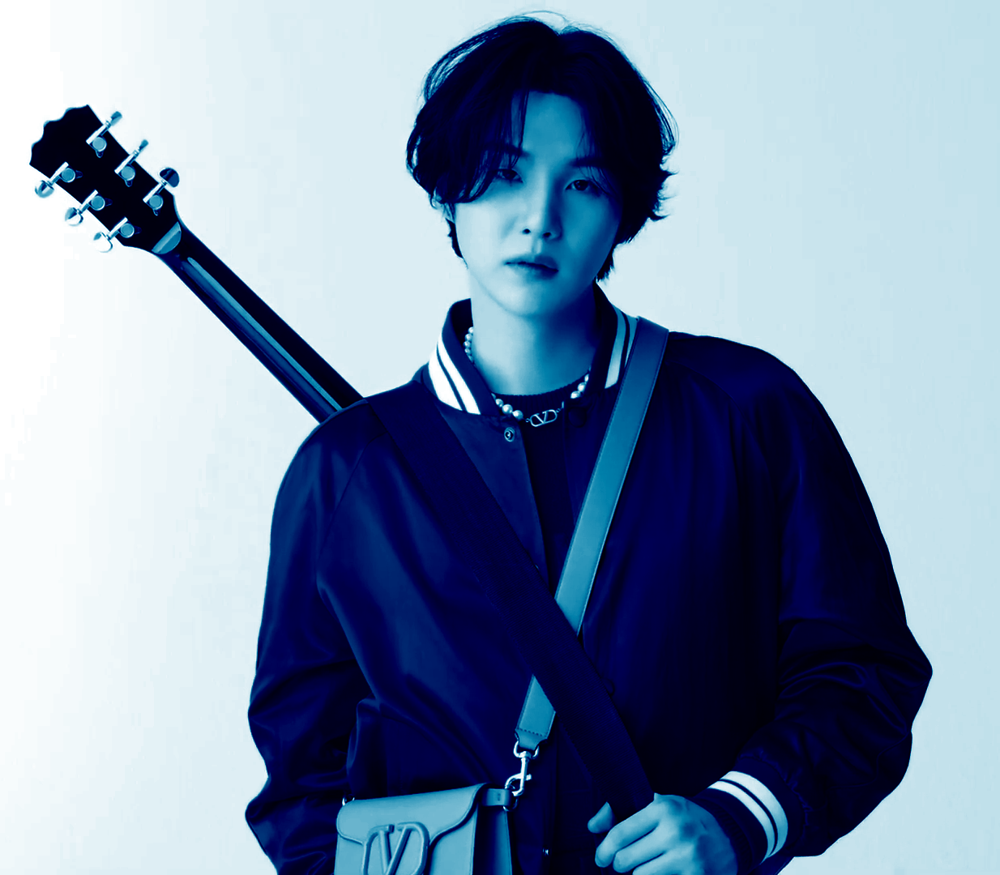

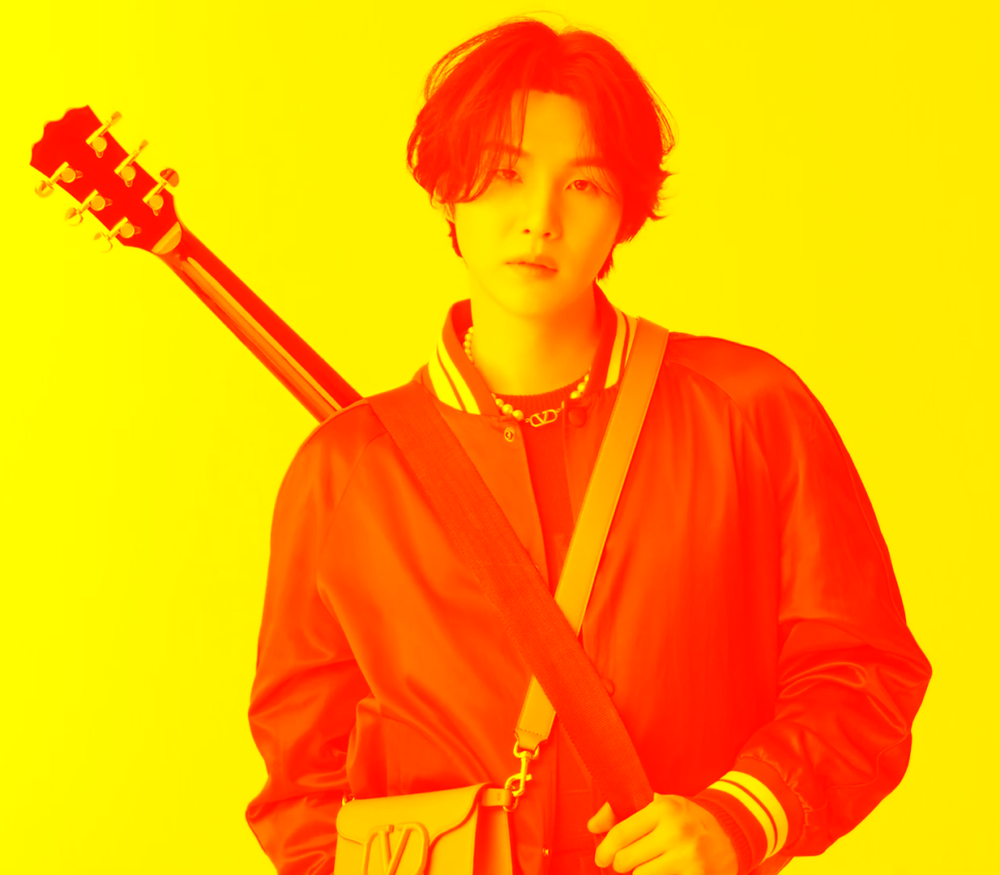

In [34]:
im1 = cv.applyColorMap(myImg, cv.COLORMAP_OCEAN)
im2 = cv.applyColorMap(myImg, cv.COLORMAP_AUTUMN)

cv2_imshow(im1)
cv2_imshow(im2)

#Morphological Operation

###Input image

In [35]:
# Upload from google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


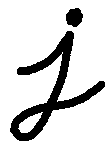

In [36]:
img1 = "/content/gdrive/My Drive/Colab Notebooks/DIP course/Images/erode1.png"
erode1 = io.imread(img1)
cv2_imshow(cv.cvtColor(erode1, cv.COLOR_BGR2RGB))
img1_gray = cv.cvtColor(erode1, cv.IMREAD_GRAYSCALE)

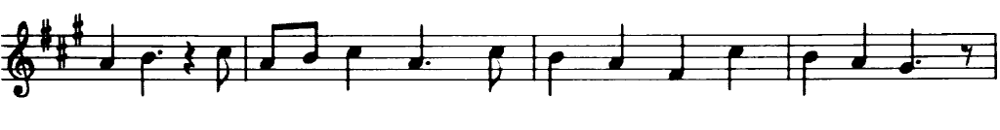

In [37]:
img2 = "/content/gdrive/My Drive/Colab Notebooks/DIP course/Images/music.png"
music = io.imread(img2)
cv2_imshow(cv.cvtColor(music, cv.COLOR_BGR2RGB))
music_gray = cv.cvtColor(music, cv.IMREAD_GRAYSCALE)

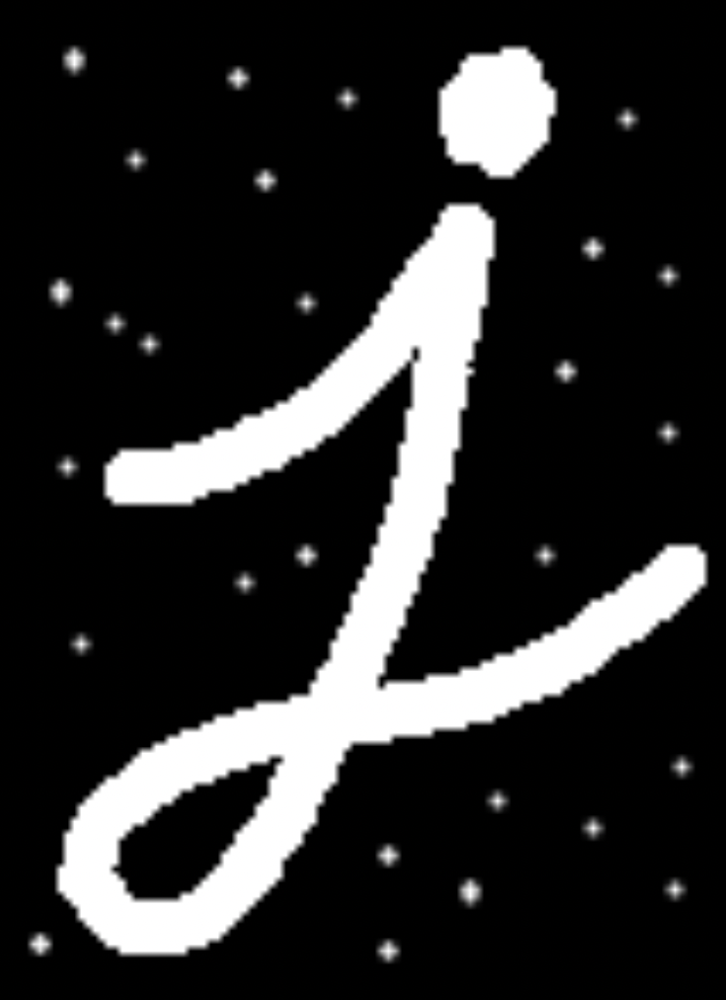

In [38]:
img3 = "/content/gdrive/My Drive/Colab Notebooks/DIP course/Images/Jnoise.png"
noise = io.imread(img3)
cv2_imshow(cv.cvtColor(noise, cv.COLOR_BGR2RGB))
noise_gray = cv.cvtColor(noise, cv.IMREAD_GRAYSCALE)

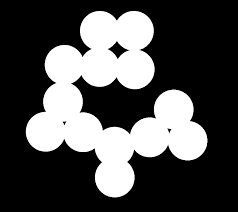

In [84]:
img4 = "/content/gdrive/My Drive/Colab Notebooks/DIP course/Images/images.png"
circles = io.imread(img4)
cv2_imshow(circles)

## Erosion

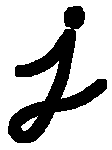

In [40]:
# Define a kernel for erosion
kernel = np.ones((5,5), np.uint8)  # Adjust the kernel size as needed
# Apply erosion
eroded_image = cv.erode(erode1, kernel, iterations = 1)
cv2_imshow(eroded_image)

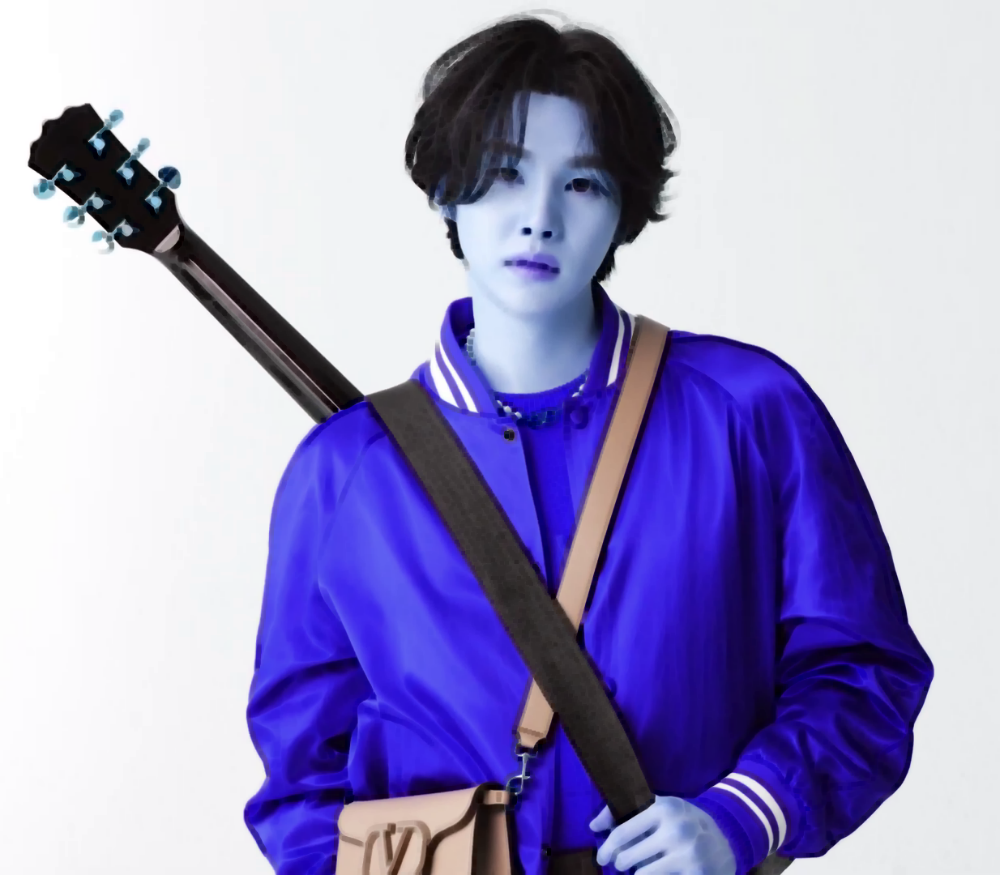

In [41]:
my_eroded = cv.erode(myImg, kernel, iterations = 1)
cv2_imshow(my_eroded)

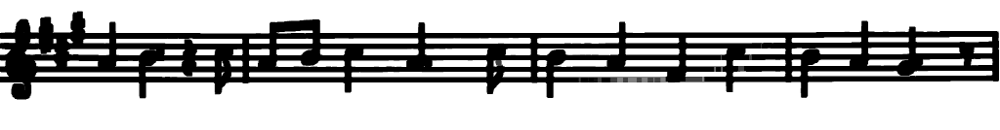

In [42]:
e_music = cv.erode(music, kernel, iterations = 1)
cv2_imshow(e_music)

##Dilation

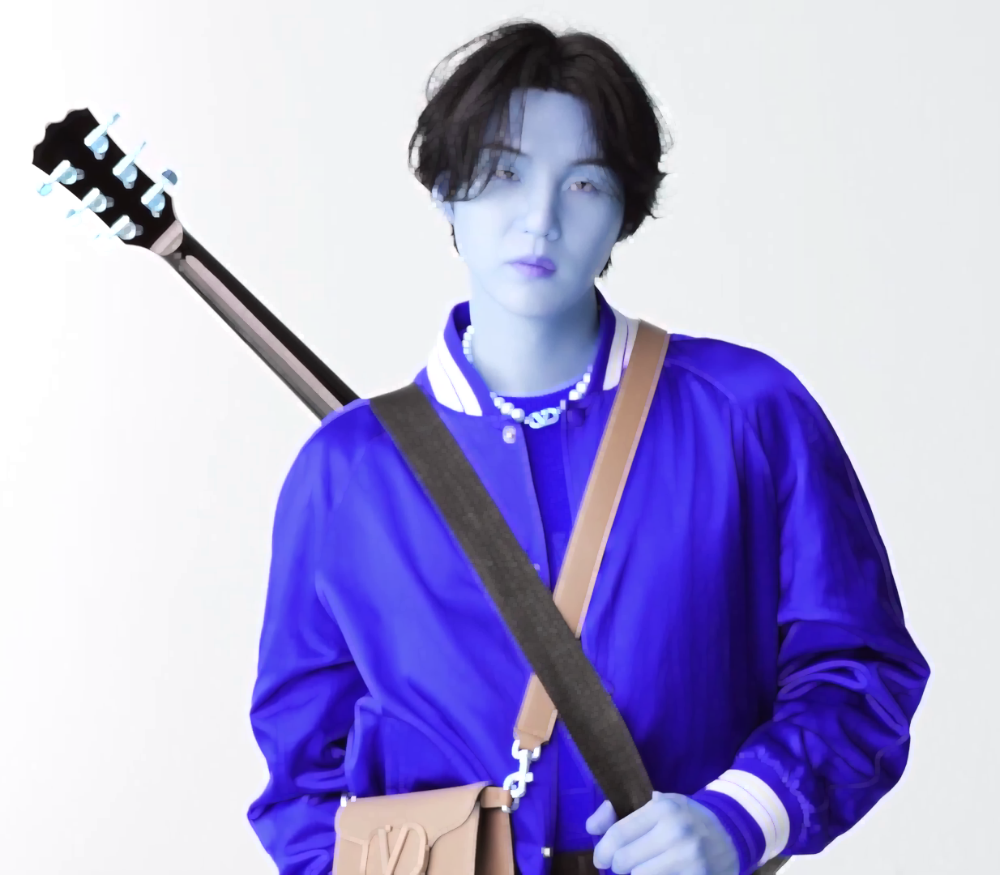

In [43]:
# Perform dilation
dilated_image = cv.dilate(myImg, kernel, iterations=1)
cv2_imshow(dilated_image)

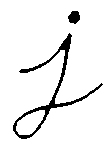

In [44]:
dilate_result = cv.dilate(erode1, kernel, iterations=1)
cv2_imshow(dilate_result)

##Combination

In [45]:
ret,thresh1 = cv.threshold(img1_gray,127,255,cv.THRESH_BINARY)

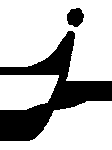

In [46]:
# Apply threshold to binarize the image
#_, binary_image = cv.threshold(erode1, 127, 255, cv.THRESH_BINARY_INV)

# Define a kernel for erosion and dilation
kernel2 = np.ones((1, 50), np.uint8)  # Adjust the kernel size as needed

# Perform erosion to remove staff lines
eroded_image = cv.erode(thresh1, kernel2, iterations = 1)

# Perform dilation to restore the shape of symbols
restored_image = cv.dilate(eroded_image, kernel2, iterations = 1)

#Display image
cv2_imshow(restored_image)

##More Examples

####Denoise

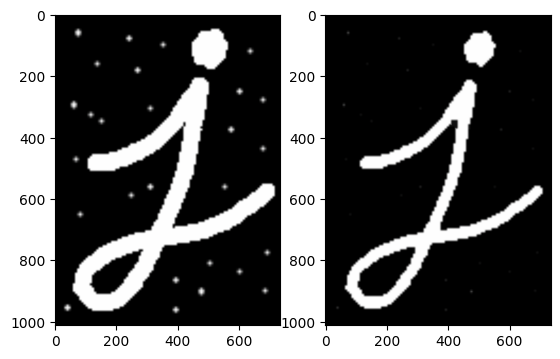

In [47]:
kernel3 = np.ones((15,15), np.uint8)
erode_noise = cv.erode(noise, kernel3, iterations=1)
plt.subplot(1, 2, 1)
plt.imshow(noise, cmap = 'gray')
plt.subplot(1, 2, 2)
plt.imshow(erode_noise, cmap = 'gray')

### Example1: Music sheet

[Refrence doc](https://docs.opencv.org/3.4/dd/dd7/tutorial_morph_lines_detection.html)

In [65]:
music = cv.bitwise_not(music)
# Apply threshold to binarize the image
_, binary_music = cv.threshold(music, 127, 255, cv.THRESH_BINARY_INV)

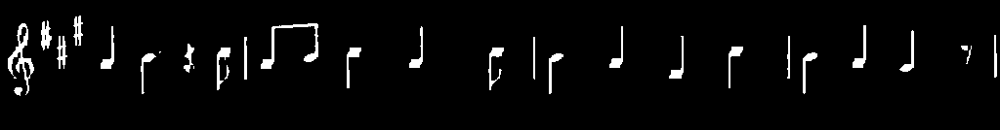

In [68]:
# Define a kernel for erosion and dilation
kernel1 = np.ones((5,1), np.uint8)

# Perform erosion
eroded_image1 = cv.erode(binary_music, kernel1, iterations=1)

#Display image
cv2_imshow(eroded_image1)

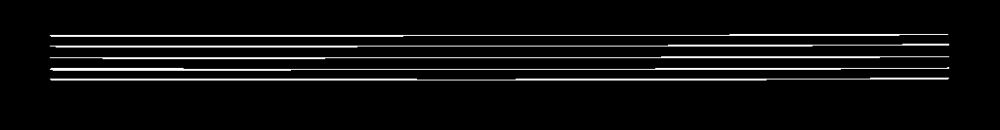

In [69]:
# Define a kernel for erosion and dilation
kernel2 = np.ones((1, 100), np.uint8)  # Adjust the kernel size as needed

# Perform erosion
eroded_image2 = cv.erode(binary_music, kernel2, iterations = 1)

#Display image
cv2_imshow(eroded_image2)

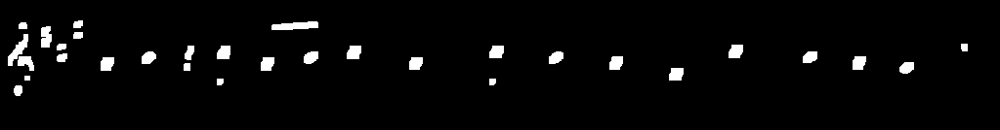

In [71]:
# Apply threshold to binarize the image
_, binary_image3 = cv.threshold(music, 127, 255, cv.THRESH_BINARY_INV)

# Define a kernel for erosion and dilation
staff_line_kernel = np.ones((5, 5), np.uint8)  # Adjust the kernel size for staff lines
note_kernel = np.ones((5, 5), np.uint8)  # Adjust the kernel size for notes

# Perform erosion to remove staff lines
eroded_image3 = cv.erode(binary_image3, staff_line_kernel, iterations=1)

# Perform dilation to restore the shape of notes
dilated_image3 = cv.dilate(eroded_image3, note_kernel, iterations=1)

# Display the original, binary, eroded, and dilated images
# plt.subplot(141), plt.imshow(music, cmap='gray'), plt.title('Original')
# plt.subplot(142), plt.imshow(binary_image3, cmap='gray'), plt.title('Binary')
# plt.subplot(143), plt.imshow(eroded_image3, cmap='gray'), plt.title('Eroded')
# plt.subplot(144), plt.imshow(dilated_image3, cmap='gray'), plt.title('Dilated')
# plt.show()
cv2_imshow(dilated_image3)

In [50]:
music_gray1 = cv.cvtColor(music, cv.COLOR_BGR2GRAY)
# Apply adaptiveThreshold at the bitwise_not of gray, notice the ~ symbol
music_gray1 = cv.bitwise_not(music_gray1)
bw = cv.adaptiveThreshold(music_gray1, 255, cv.ADAPTIVE_THRESH_MEAN_C, \
                          cv.THRESH_BINARY, 15, -2)
# Create the images that will use to extract the horizontal and vertical lines
horizontal = np.copy(bw)
vertical = np.copy(bw)

In [51]:
# Specify size on horizontal axis
cols = horizontal.shape[1]
horizontal_size = cols // 30
# Create structure element for extracting horizontal lines through morphology operations
horizontalStructure = cv.getStructuringElement(cv.MORPH_RECT, (horizontal_size, 1))
# Apply morphology operations
horizontal = cv.erode(horizontal, horizontalStructure)
horizontal = cv.dilate(horizontal, horizontalStructure)

In [52]:
# Specify size on vertical axis
rows = vertical.shape[0]
verticalsize = rows // 30
# Create structure element for extracting vertical lines through morphology operations
verticalStructure = cv.getStructuringElement(cv.MORPH_RECT, (1, verticalsize))
# Apply morphology operations
vertical = cv.erode(vertical, verticalStructure)
vertical = cv.dilate(vertical, verticalStructure)

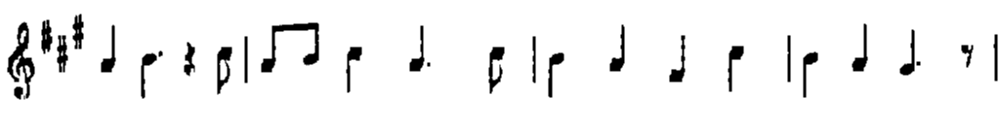

In [53]:
# Inverse vertical image
vertical = cv.bitwise_not(vertical)
#show_wait_destroy("vertical_bit", vertical)
'''
Extract edges and smooth image according to the logic
    1. extract edges
    2. dilate(edges)
    3. src.copyTo(smooth)
    4. blur smooth img
    5. smooth.copyTo(src, edges)
'''
# Step 1
edges = cv.adaptiveThreshold(vertical, 255, cv.ADAPTIVE_THRESH_MEAN_C, \
                                cv.THRESH_BINARY, 3, -2)

# Step 2
kernel = np.ones((2, 2), np.uint8)
edges = cv.dilate(edges, kernel)

# Step 3
smooth = np.copy(vertical)
# Step 4
smooth = cv.blur(smooth, (2, 2))
# Step 5
(rows, cols) = np.where(edges != 0)
vertical[rows, cols] = smooth[rows, cols]
# Show final result
cv2_imshow(vertical)

###Example 2: Coin

In [86]:
circles = cv.bitwise_not(circles)
# Apply threshold to binarize the image
_, binary_c = cv.threshold(circles, 127, 255, cv.THRESH_BINARY_INV)

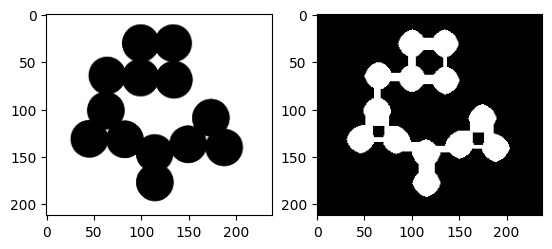

In [90]:
kernel_c = np.ones((10,10), np.uint8)
erode_c = cv.erode(binary_c, kernel_c, iterations=1)
plt.subplot(1, 2, 1)
plt.imshow(circles, cmap = 'gray')
plt.subplot(1, 2, 2)
plt.imshow(erode_c, cmap = 'gray')

###Example 3: Handwriting

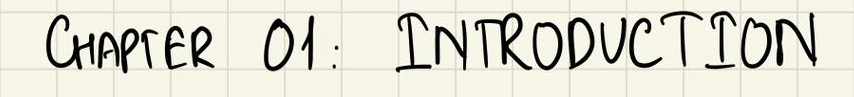

In [79]:
img5 = "/content/gdrive/My Drive/Colab Notebooks/DIP course/Images/handwrite.png"
hw = io.imread(img5)
cv2_imshow(cv.cvtColor(hw, cv.COLOR_BGR2RGB))
hw_gray = cv.cvtColor(hw, cv.IMREAD_GRAYSCALE)

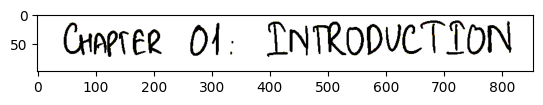

In [80]:
ret,hw1 = cv.threshold(hw_gray,155,255,cv.THRESH_BINARY)
# hand_writing = hand_writing[:200, 300:1000]
plt.imshow(hw1, cmap = 'gray')

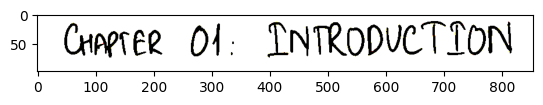

In [82]:
kernel_w =  cv.getStructuringElement(cv.MORPH_CROSS,(30,30))

hand_writing_close = cv.erode(hw1, kernel)
hand_writing_close = cv.dilate(hand_writing_close, kernel)

plt.imshow(hand_writing_close,cmap= 'gray')